## Imports

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.preprocessing import MinMaxScaler
plt.rcParams.update({'figure.max_open_warning': 0})
import operator

### Read Data

In [3]:
def read_data(file_name):
    file_path = file_name
    data = pd.read_csv(file_path,sep=',',names = ['time_counter','accel_base_X','accel_base_Y','accel_base_Z','gyro_base_X',
                                                  'gyro_base_Y','gyro_base_Z','accel_right_X','accel_right_Y','accel_right_Z',
                                                  'gyro_right_X','gyro_right_Y','gyro_right_Z','accel_left_X','accel_left_Y',
                                                  'accel_left_Z','gyro_left_X','gyro_left_Y','gyro_left_Z','fall_detection'])
    return data

In [4]:
def read_combined_csvdata(file_name, airbag_data):
    file_path = file_name
    data = pd.read_csv(file_path)
    data['Time Point Name'] = pd.to_numeric(data['Time Point Name'], errors='coerce')
    data = data[(data['Time Point Name'] > 100) & (data['Time Point Name'] < 200) &
                (data['Impact milisec'].notnull()) & ((data['Start milisec']) < (airbag_data.iloc[-1][0]))]
    data = data[['Time Point Name','Start milisec','Impact milisec', 'End Milisec','Duration']]
    return data

In [5]:
def add_new_fall_value(airbag_data, manual_data):
    # Create Column that is the magnitude of the acceleration vector from the data
    # Iterate through the combined data to find points at which time counter of the airbag_data is within the start and end milliseconds of the row
    # find the max of the 'accel_base_mag' within that time frame, set 'cal_impact_milisec' = 80
    airbag_data['accel_base_mag'] =  np.sqrt(airbag_data['accel_base_X']**2 + airbag_data['accel_base_Y']**2 +
                                             airbag_data['accel_base_Z']**2)
    for index, row in manual_data.iterrows():
        airbag_data.loc[(airbag_data['accel_base_mag'] == \
                                             (airbag_data.loc[(airbag_data['time_counter'] >= row['Start milisec']) & \
                                                                   (airbag_data['time_counter'] < row['End Milisec']),
                                                                   'accel_base_mag'].max())) & \
                                                 (airbag_data['time_counter'] >= row['Start milisec']) & \
                                                 (airbag_data['time_counter'] < row['End Milisec']),
                                                 'cal_impact_milisec'] = 80


In [6]:
def big_size_plot_of_acceleration_vs_time(data, name, x=15, y=10, left = -1, right = -1):
    fig, axs = plt.subplots(figsize=(x,y))
    fig.suptitle('Bace acceleration for AIRBAG-'+name)
    
    axs.plot( data.time_counter*(10**(-3)),data.accel_base_X*(10**(-3)), marker='', color='red', linewidth=1, label='X')
    axs.plot( data.time_counter*(10**(-3)),data.accel_base_Y*(10**(-3)), marker='', color='blue', linewidth=1, label='Y')
    axs.plot( data.time_counter*(10**(-3)),data.accel_base_Z*(10**(-3)), marker='', color='green', linewidth=1, label='Z')
    axs.plot( data.time_counter*(10**(-3)),data.accel_base_mag*(10**(-3)), marker='', color='black', linewidth=1, label='Magnitude')
    axs.scatter(data.time_counter*(10**(-3)),data.cal_impact_milisec/4,s=30,c = 'violet')
    
    if (left>-1 and right>-1):
        axs.set_xlim(left,right)
    elif (left > -1):
        axs.set_xlim(left)
    elif (right > -1):
        axs.set_xlim(right)
    else:
        axs.set_xlim()
    
    axs.legend()
    axs.set_title('Data')

In [7]:
def plot_all_impact_graphs(airbag_data, manual_data):
    for index, row in manual_data.iterrows():
        big_size_plot_of_acceleration_vs_time(data=airbag_data,label='S2',left=row['Start milisec']*(10**(-3))/60,
                                              right= row['End Milisec']*(10**(-3))/60)

In [8]:
def plot_all_zoom_impact_graphs(airbag_data,manual_data,label,imp_bef = 250,imp_aft = 300):
    cnt = 1
    for each_impact in airbag_data.loc[airbag_data['cal_impact_milisec'] == 80,'time_counter'].values:
        print('plot no.',str(cnt),' at ',each_impact)
        cnt+=1
        big_size_plot_of_acceleration_vs_time(data=airbag_data,name= label,left=(each_impact - imp_bef)*(10**(-3)),
                                      right= (each_impact + imp_aft)*(10**(-3)))

In [9]:
def plot_falls_zoomed(subject, left, right, name, fn, width=10, height=8):
    fig, axs = plt.subplots(figsize=(width, height))
    falls = subject.loc[subject["cal_impact_milisec"] == 80]
    fall_times = falls['time_counter'].values.tolist()
    
    fig.suptitle("Subject " + name + " - Fall Number " + str(fn+1) + " - Occurs at " + str(fall_times[fn] * (10 ** (-3))) + " s")
    fc = 1
    
    # Get Indexes for time
    start_time = fall_times[fn] - left
    end_time = fall_times[fn] + right
    start_time = subject.loc[subject["time_counter"] == start_time].index[0]
    end_time = subject.loc[subject["time_counter"] == end_time].index[0]

    # Setup X and Y for plotting
    time = subject.loc[start_time:end_time, 'time_counter'] * (10**(-3))
    accel = subject.loc[start_time:end_time, 'accel_base_mag'] *(10**(-3))
    x = subject.loc[start_time:end_time, 'accel_base_X'] * (10**(-3))
    y = subject.loc[start_time:end_time, 'accel_base_Y'] * (10**(-3))
    z = subject.loc[start_time:end_time, 'accel_base_Z'] *(10**(-3))
#     fall = subject.loc[start_time:end_time, 'cal_impact_milisec'] *(10**(-3))
# 
    # Plot Graphs
    plt.xlabel("Time in (s)")
    plt.ylabel("XYZ, Magnitude")
    axs.plot(time, accel, marker='', color='black', linewidth=1, alpha = 0.8, label="Accel")
    axs.plot(time, x, marker='', color='blue', linewidth=1, alpha = 0.8, label="X")
    axs.plot(time, y, marker='', color='green', linewidth=1, alpha = 0.8, label="Y")
    axs.plot(time, z, marker='', color='red', linewidth=1, alpha = 0.8, label="Z")
    
    # Plot Max Fall Time
    plt.axvline(x = fall_times[fn] * (10**(-3)), color="m", linewidth=1, label="Impact")
    
    
    # Plot One Second Rem Range
    plt.axvline(x = fall_times[fn] * (10**(-3)) + 1, color="m", linewidth=3, label="Fall Radius")
    plt.axvline(x = fall_times[fn] * (10**(-3)) - 1, color="m", linewidth=3)

    ul = max(max(accel), max(x), max(y), max(z)) + 5
    dl = min(min(accel), min(x), min(y), min(z)) - 5
     
    plt.ylim(dl, ul)
    plt.legend()
    return fig

In [11]:
# READ IN DATA
data_path = '../../../Airbag_Data/'

#S1
s1_data=read_data(data_path + 'S1-Airbag.csv')
s1_combined = read_combined_csvdata(data_path + 'S1-Combined.csv', s1_data)
add_new_fall_value(s1_data, s1_combined)

#S2
s2_data=read_data(data_path + 'S2-Airbag.csv')
s2_combined = read_combined_csvdata(data_path + 'S2-Combined.csv', s2_data)
add_new_fall_value(s2_data, s2_combined)

# #S3
s3_data=read_data(data_path + 'S3-Airbag.csv')
s3_combined = read_combined_csvdata(data_path + 'S3-Combined.csv', s3_data)
add_new_fall_value(s3_data, s3_combined)

# #C1
c1_data=read_data(data_path + 'C1-Airbag.csv')
c1_combined = read_combined_csvdata(data_path + 'C1-Combined.csv', c1_data)
c1_data2 = pd.DataFrame.copy(c1_data, deep=True)
add_new_fall_value(c1_data2, c1_combined)

# #C2
c2_data=read_data(data_path + 'C2-Airbag.csv')
c2_combined = read_combined_csvdata(data_path + 'C2-Combined.csv', c2_data)
add_new_fall_value(c2_data, c2_combined)

# #C3
c3_data=read_data(data_path + 'C3-Airbag.csv')
c3_combined = read_combined_csvdata(data_path + 'C3-Combined.csv', c3_data)
add_new_fall_value(c3_data, c3_combined)   


### Visualizing Data

In [21]:
s1_falls = len(s1_data.loc[s1_data["cal_impact_milisec"] == 80])
s2_falls = len(s2_data.loc[s2_data["cal_impact_milisec"] == 80])
s3_falls = len(s3_data.loc[s3_data["cal_impact_milisec"] == 80])
c1_falls = len(c1_data2.loc[c1_data2["cal_impact_milisec"] == 80])
c2_falls = len(c2_data.loc[c2_data["cal_impact_milisec"] == 80])
c3_falls = len(c3_data.loc[c3_data["cal_impact_milisec"] == 80])
falls = [s1_falls, s2_falls, s3_falls, c1_falls, c2_falls, c3_falls]
data = [s1_data, s2_data, s3_data, c1_data2, c2_data, c3_data]
subjects = ["S1", "S2", "S3", "C1", "C2", "C3"]

### Display Falls

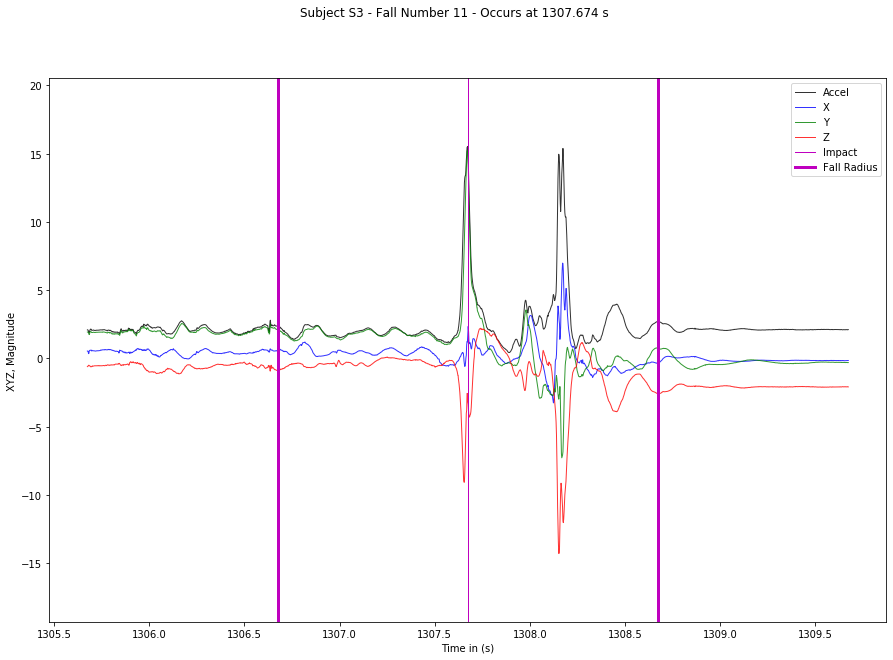

In [13]:
s = 2 # 0 - 5
fn = 10 # 0 - (n-1)
f = plot_falls_zoomed(data[s], 2000, 2000, subjects[s], fn, width=15, height=10)



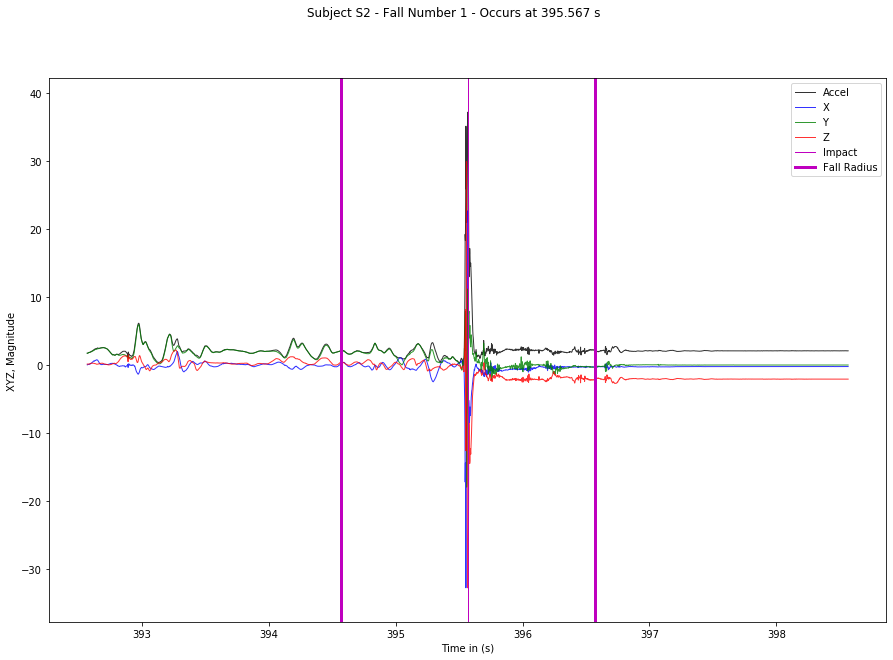

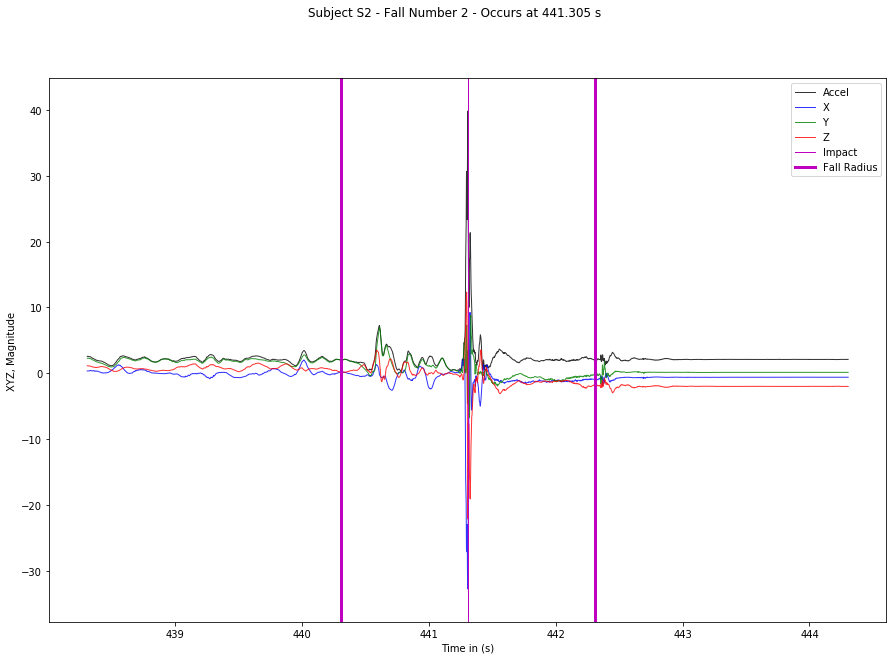

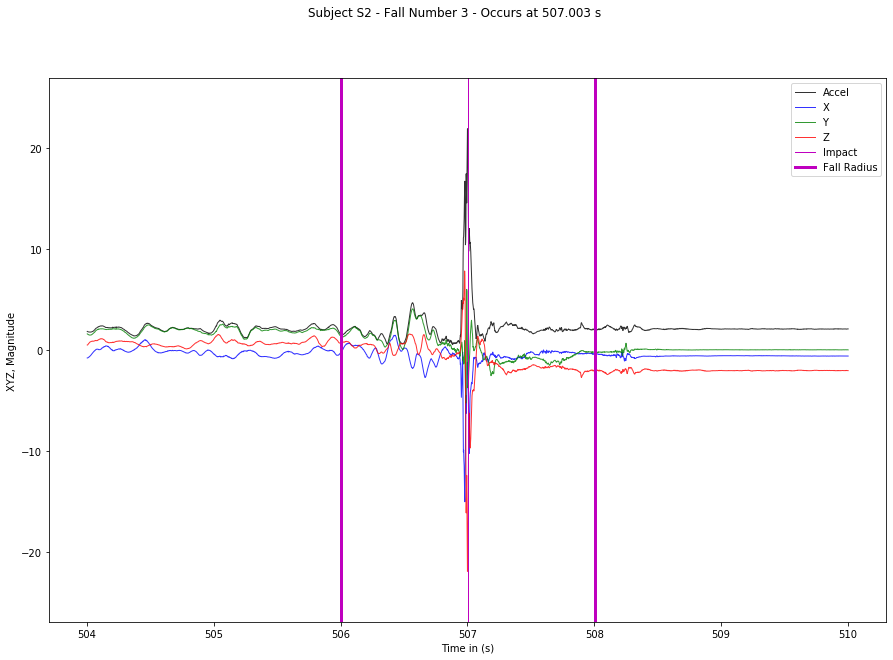

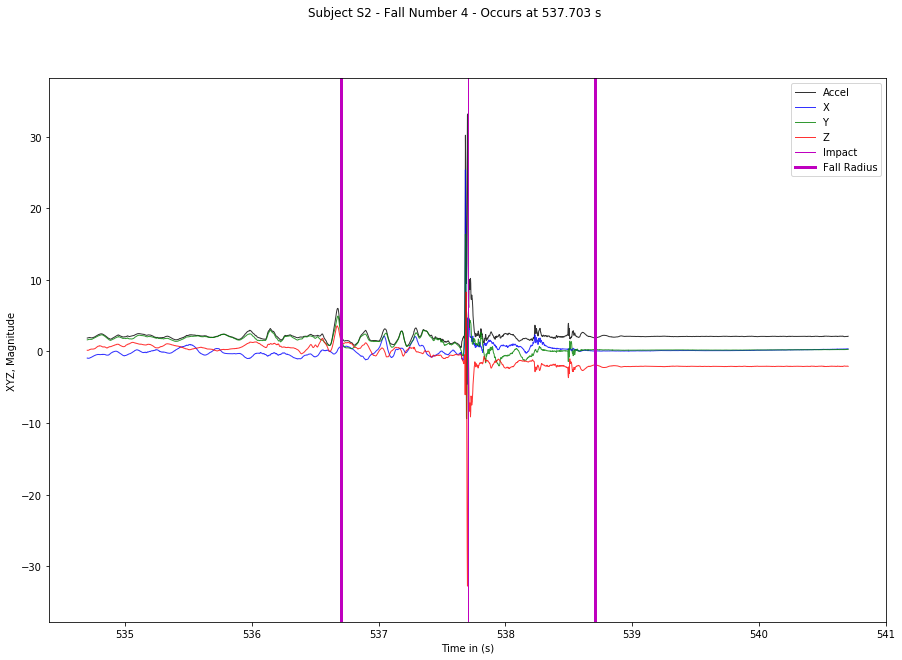

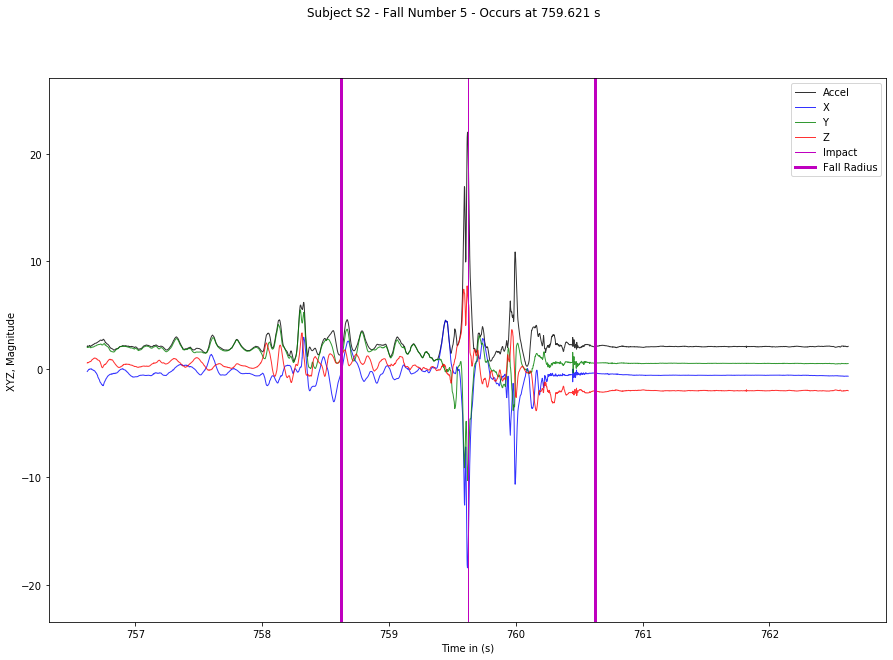

...

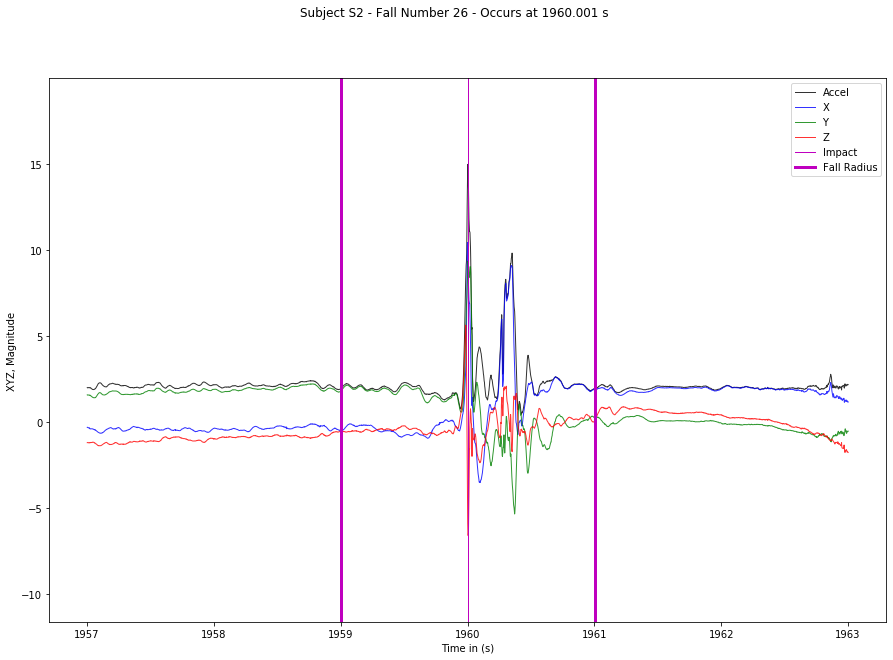

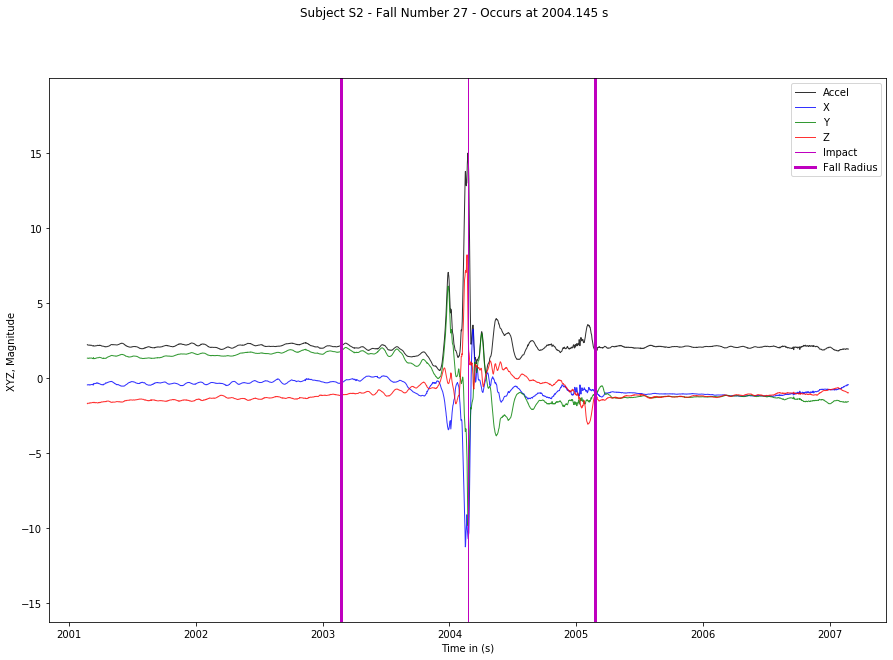

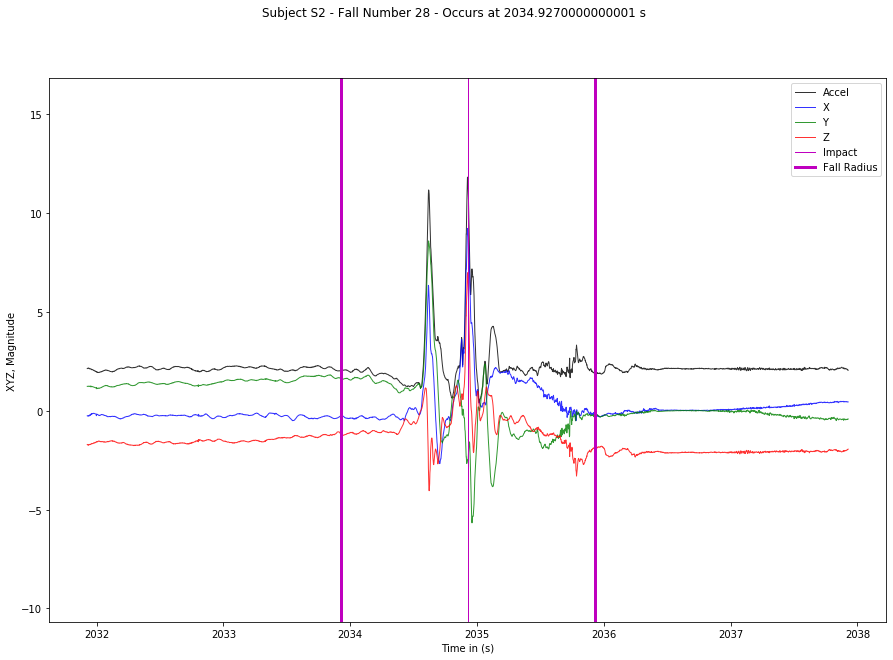

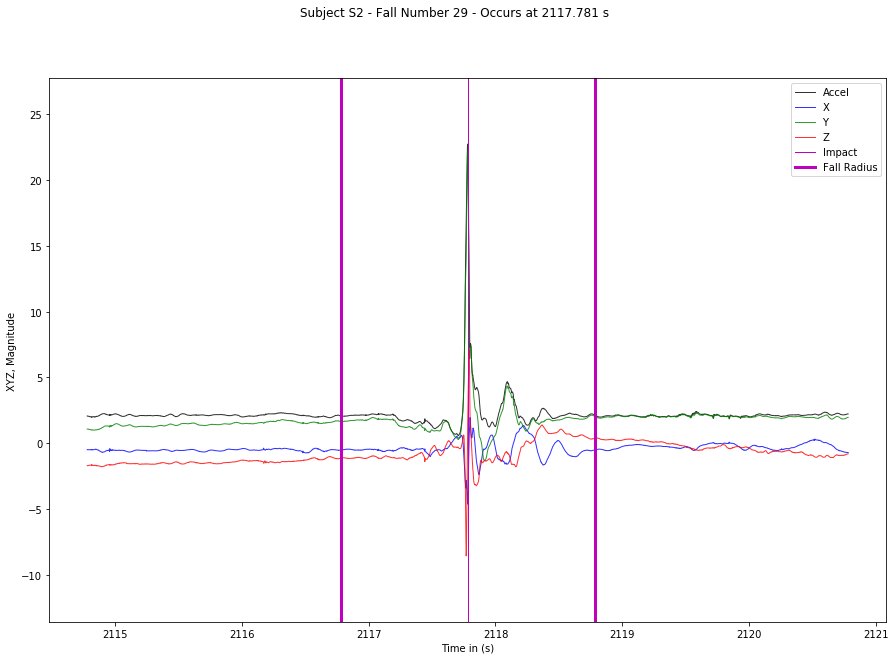

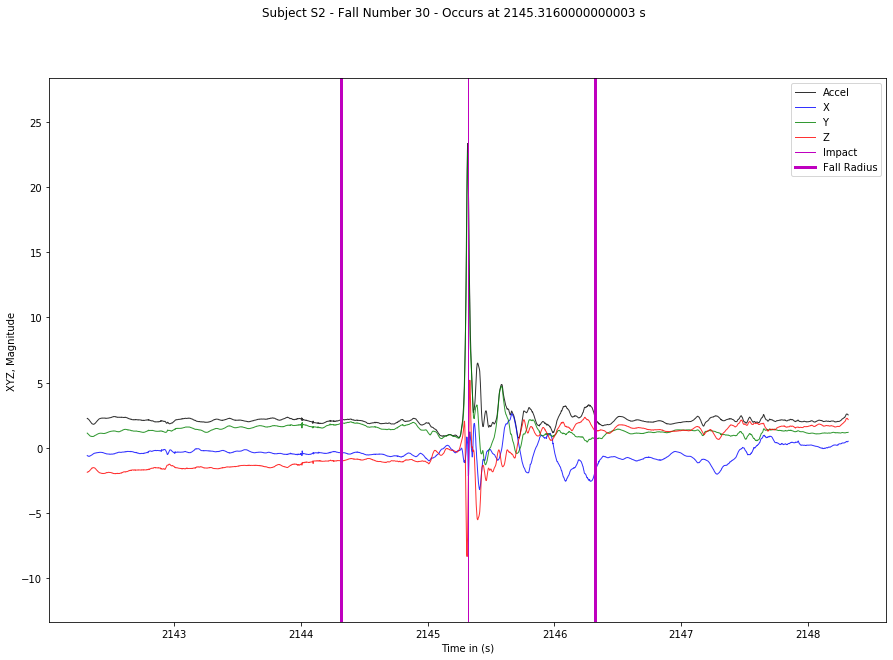

In [284]:
for i in range(falls[s]):
    f = plot_falls_zoomed(data[s], 3000, 3000, subjects[s], i, width=15, height=10)

### Convert Falls to PDF

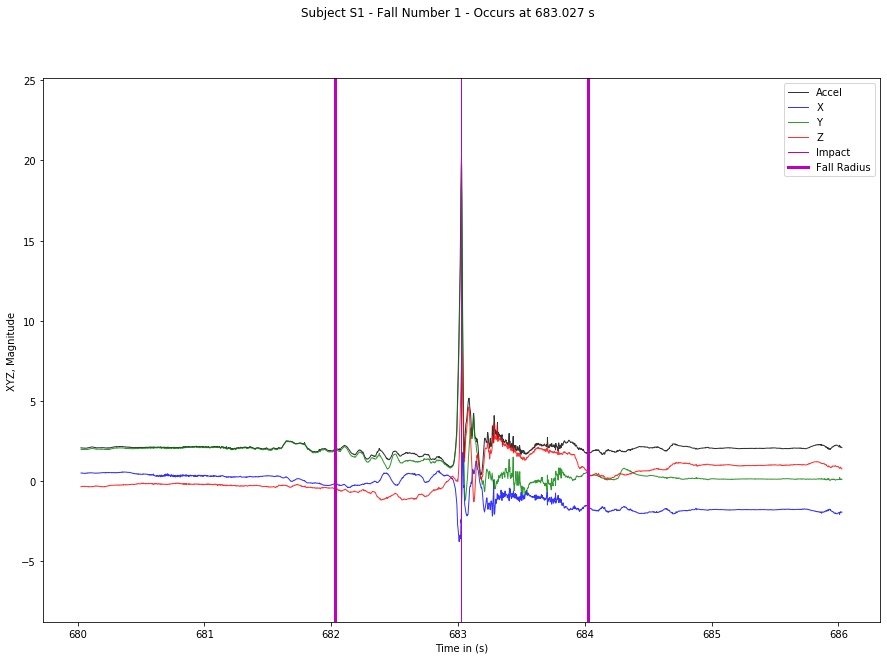

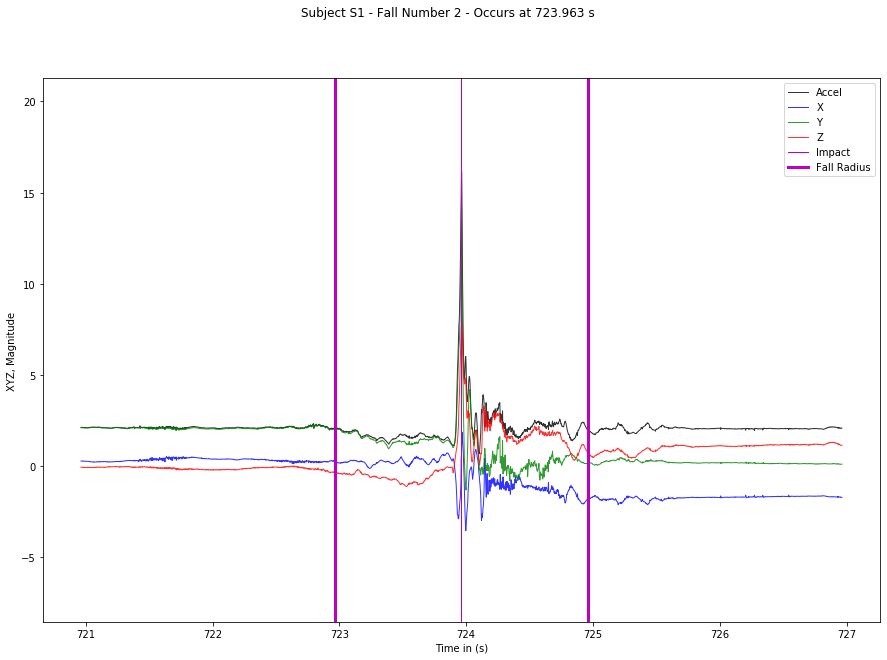

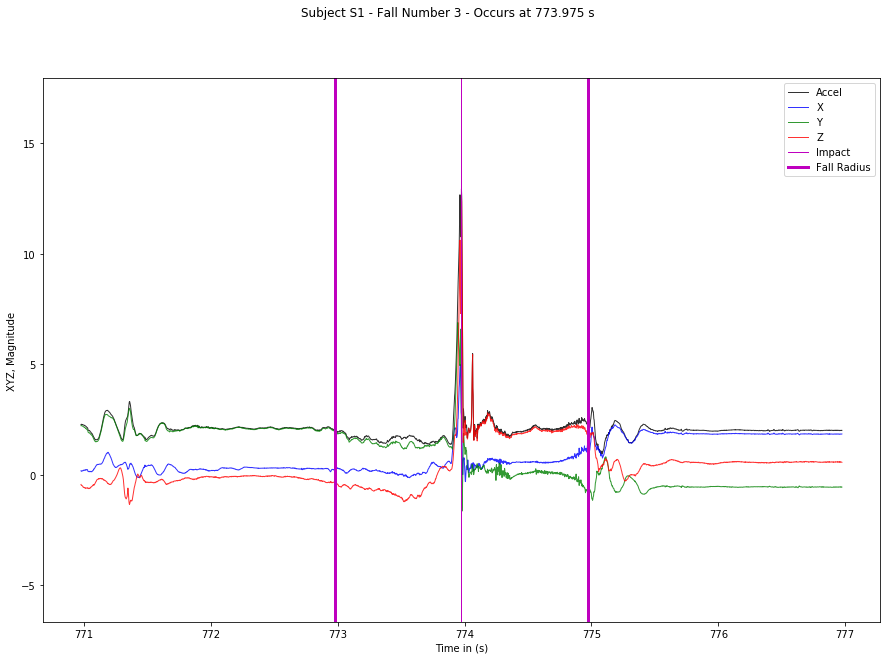

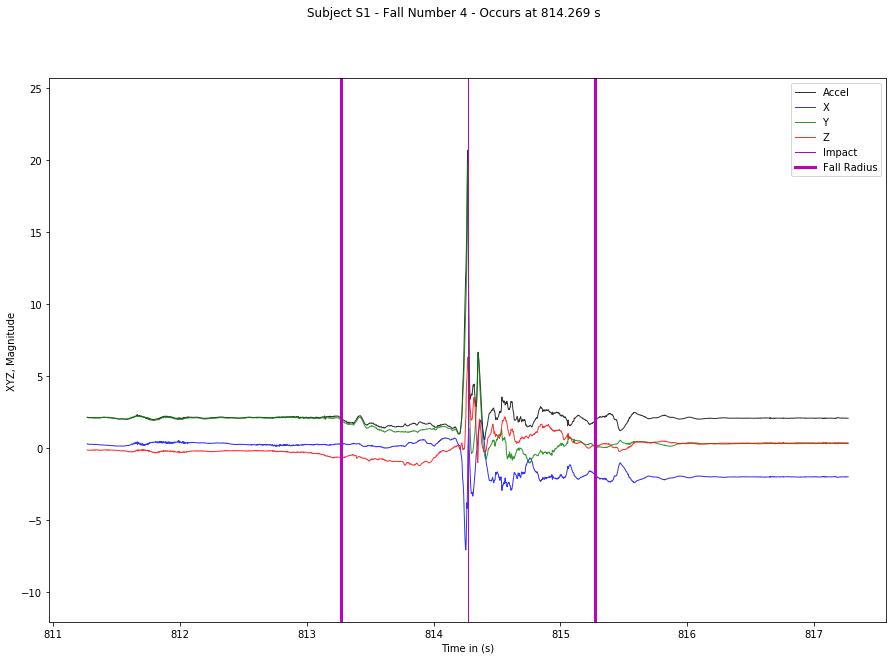

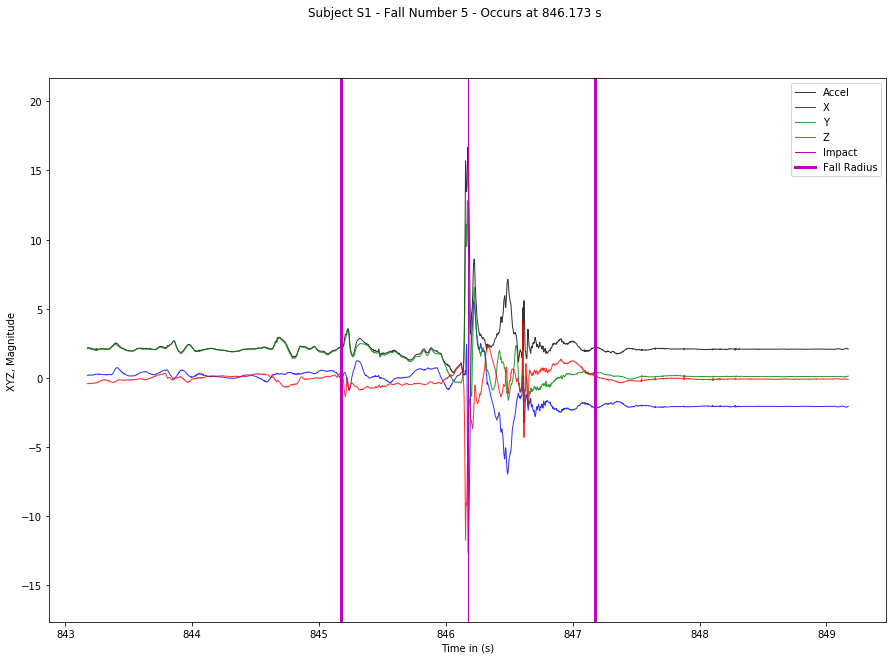

...

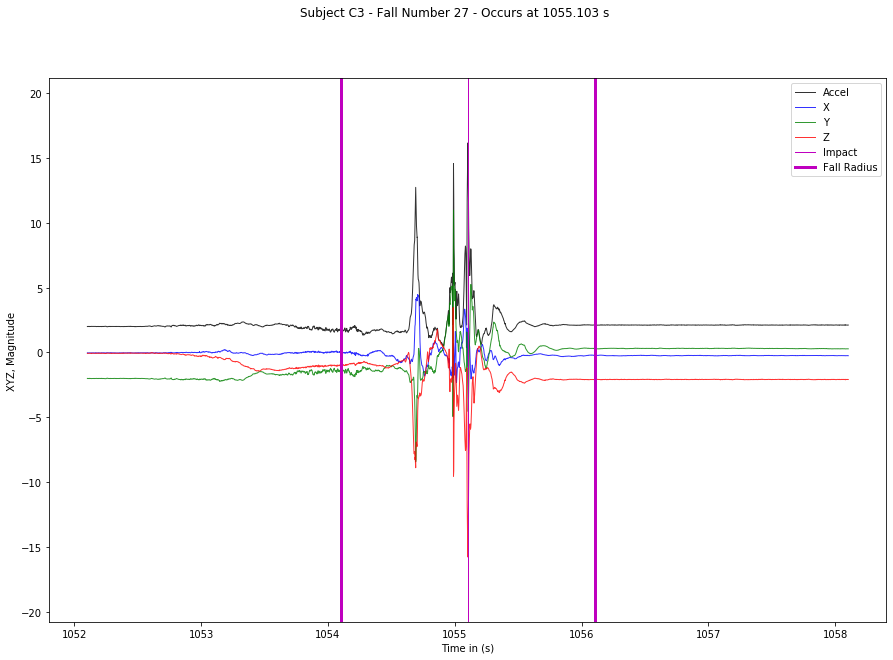

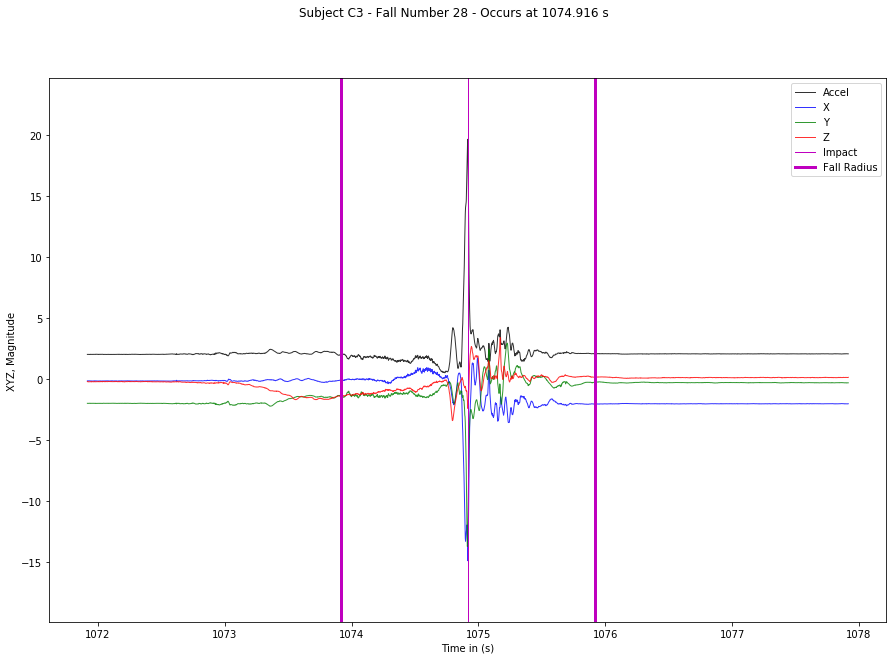

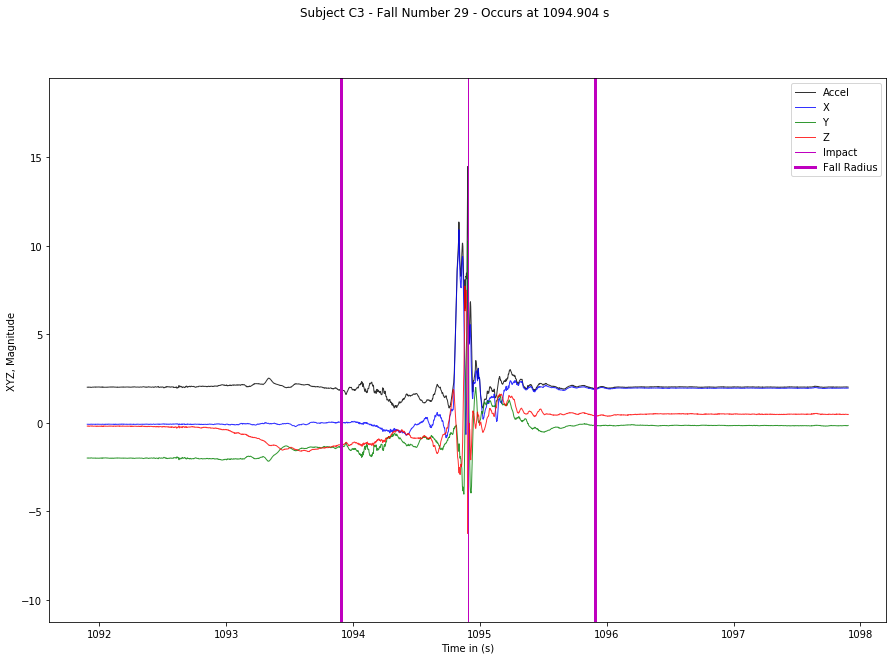

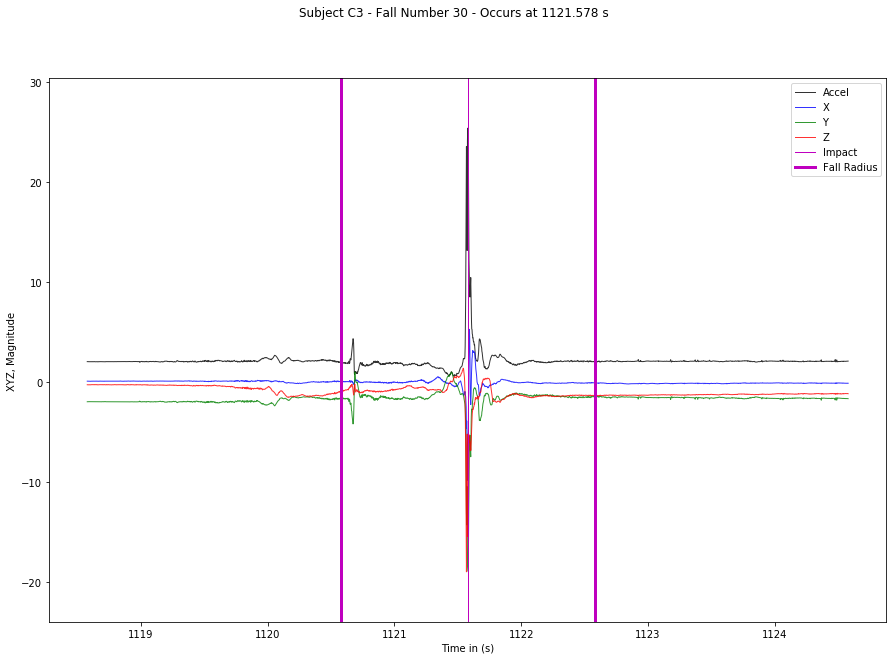

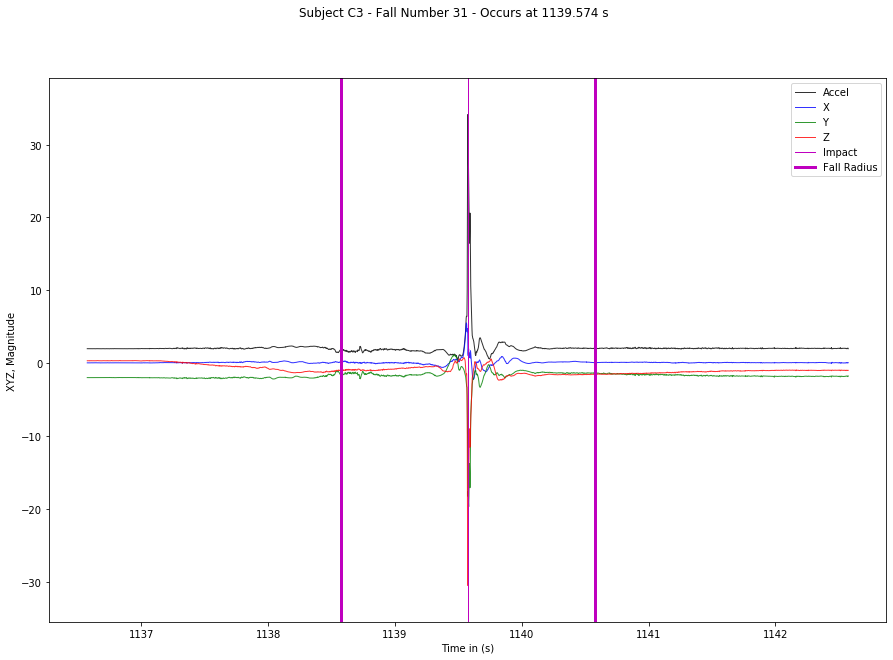

In [278]:
save_path = "./Zoomed_Out/"
for i in range(6):
    subject = subjects[i]
    pp = PdfPages(save_path + subject + "_falls_out.pdf")
    for j in range(falls[i]):
        f = plot_falls_zoomed(data[i], 3000, 3000, subject, j, width=15, height=10)
        pp.savefig(f)
    pp.close()

## Plotting average of a given radius from impact value

In [494]:
def plotAvg(subject_data, subject_name, radius, scaled, width=15, height=10):
    
    # Plots the average value of a given subject data within a fall radius
    fig, axs = plt.subplots(figsize=(width, height))
    falls = subject_data.loc[subject_data["cal_impact_milisec"] == 80]
    fall_times = falls['time_counter'].values.tolist()
    num_falls = len(fall_times)
    title = "Average of Subject " + subject_name +  " - Radius of " + str(radius) + " Seconds"
    
    inc = 5
    
    subject_falls = subject_data[['accel_base_X', 'accel_base_Y', 'accel_base_Z', 'accel_base_mag']].copy()
    
    if (scaled):
        title = "Scaled " + title
        inc = 0.5
        sc = MinMaxScaler()
        subject_falls[['accel_base_X', 'accel_base_Y', 'accel_base_Z', 'accel_base_mag']] = sc.fit_transform(subject_falls[['accel_base_X', 'accel_base_Y', 'accel_base_Z', 'accel_base_mag']])
    print(subject_falls)
    # Compute average of all falls
    
    fig.suptitle(title)
    
    mX = []
    mY = []
    mZ = []
    mAccel = []
    
    for fn in range(num_falls):
        start_time = fall_times[fn] - (radius * 500)
        end_time = fall_times[fn] + (radius * 500)
        start_time = subject_data.loc[subject_data["time_counter"] == start_time].index[0]
        end_time = subject_data.loc[subject_data["time_counter"] == end_time].index[0]
        
        accel, x, y, z = 0, 0, 0, 0
        
        if (not scaled):
            accel = subject_falls.loc[start_time:end_time, 'accel_base_mag'] * (10 ** (-3))
            x = subject_falls.loc[start_time:end_time, 'accel_base_X'] * (10 ** (-3))
            y = subject_falls.loc[start_time:end_time, 'accel_base_Y'] * (10 ** (-3))
            z = subject_falls.loc[start_time:end_time, 'accel_base_Z'] * (10 ** (-3))
        else:
            accel = subject_falls.loc[start_time:end_time, 'accel_base_mag']
            x = subject_falls.loc[start_time:end_time, 'accel_base_X'] 
            y = subject_falls.loc[start_time:end_time, 'accel_base_Y']
            z = subject_falls.loc[start_time:end_time, 'accel_base_Z']

        x = x.values
        y = y.values
        z = z.values
        accel = accel.values
        
        mX.append(x)
        mY.append(y)
        mZ.append(z)
        mAccel.append(accel)

    mX = np.mean(mX, axis=0)
    mY = np.mean(mY, axis=0)
    mZ = np.mean(mZ, axis=0)
    mAccel = np.mean(mAccel, axis=0)

    # Plot Graph
    plt.xlabel("Time")
    plt.ylabel("Average of XYZ and Magnitude")
    
    # Generate X values around impact time
    step_size = (radius*2) / (len(mX) - 1)
    time = np.arange(-1 * radius, radius + step_size, step_size)
    
    axs.plot(time, mAccel, marker='', color='black', linewidth=1, alpha = 0.8, label="Accel")
    axs.plot(time, mX, marker='', color='blue', linewidth=1, alpha = 0.8, label="X")
    axs.plot(time, mY, marker='', color='green', linewidth=1, alpha = 0.8, label="Y")
    axs.plot(time, mZ, marker='', color='red', linewidth=1, alpha = 0.8, label="Z")
    
    ul = max([np.max(mAccel), np.max(mX), np.max(mY), np.max(mZ)]) + inc
    dl = min([np.min(mAccel), np.min(mX), np.min(mY), np.min(mZ)]) - inc
     
    plt.ylim(dl, ul)
    plt.legend()
    return fig
    

In [495]:
def plotAllAvg(data, radius, scaled, width=15, height=10):
    fig, axs = plt.subplots(figsize=(width, height))
    title = "Average of Subjects - Radius of " + str(radius) + " Seconds"
    
    inc = 5
    
    if (scaled):
        title = "Scaled " + title
        inc = 0.5
    fig.suptitle(title)
    gX, gY, gZ, gAccel = [], [], [], []
    for i in range(len(data)): # Loop through each subject
        subject_data = data[i].copy()
        falls = subject_data.loc[subject_data["cal_impact_milisec"] == 80]
        fall_times = falls['time_counter'].values.tolist()
        num_falls = len(fall_times)
        
        if (scaled): # Scale data if necessary
            sc = MinMaxScaler()
            subject_data[['accel_base_X', 'accel_base_Y', 'accel_base_Z', 'accel_base_mag']] = sc.fit_transform(subject_data[['accel_base_X', 'accel_base_Y', 'accel_base_Z', 'accel_base_mag']])

        mX = []
        mY = []
        mZ = []
        mAccel = []

        for fn in range(num_falls): # Loop through the falls of a given subject
            start_time = fall_times[fn] - (radius * 500)
            end_time = fall_times[fn] + (radius * 500)
            start_time = subject_data.loc[subject_data["time_counter"] == start_time].index[0]
            end_time = subject_data.loc[subject_data["time_counter"] == end_time].index[0]

            accel, x, y, z = 0, 0, 0, 0
            
            # Handle Scaling 
            if (not scaled):
                accel = subject_data.loc[start_time:end_time, 'accel_base_mag'] * (10 ** (-3))
                x = subject_data.loc[start_time:end_time, 'accel_base_X'] * (10 ** (-3))
                y = subject_data.loc[start_time:end_time, 'accel_base_Y'] * (10 ** (-3))
                z = subject_data.loc[start_time:end_time, 'accel_base_Z'] * (10 ** (-3))
            else:
                accel = subject_data.loc[start_time:end_time, 'accel_base_mag']
                x = subject_data.loc[start_time:end_time, 'accel_base_X'] 
                y = subject_data.loc[start_time:end_time, 'accel_base_Y']
                z = subject_data.loc[start_time:end_time, 'accel_base_Z']

            x = x.values
            y = y.values
            z = z.values
            accel = accel.values

            mX.append(x)
            mY.append(y)
            mZ.append(z)
            mAccel.append(accel)
            
        # Average the falls of the subject    
        mX = np.mean(mX, axis=0)
        mY = np.mean(mY, axis=0)
        mZ = np.mean(mZ, axis=0)
        mAccel = np.mean(mAccel, axis=0)
        
        # Add averaged falls to global average arrays 
        gX.append(mX)
        gY.append(mY)
        gZ.append(mZ)
        gAccel.append(mAccel)
    
    # Calculate global averages
    gX = np.mean(gX, axis=0)
    gY = np.mean(gY, axis=0)
    gZ = np.mean(gZ, axis=0)
    gAccel = np.mean(gAccel, axis=0)
    
    # Generate X-values centered around the time of impact
    step_size = (radius*2) / (len(gX) - 1)
    time = np.arange(-1 * radius, radius + step_size, step_size)
    
    # Plot Graph
    plt.xlabel("Time")
    plt.ylabel("Average of XYZ and Magnitude")
    
    axs.plot(time, gAccel, marker='', color='black', linewidth=1, alpha = 0.8, label="Accel")
    axs.plot(time, gX, marker='', color='blue', linewidth=1, alpha = 0.8, label="X")
    axs.plot(time, gY, marker='', color='green', linewidth=1, alpha = 0.8, label="Y")
    axs.plot(time, gZ, marker='', color='red', linewidth=1, alpha = 0.8, label="Z")
    
    # Calculate y-axis limits
    ul = max([np.max(mAccel), np.max(mX), np.max(mY), np.max(mZ)]) + inc
    dl = min([np.min(mAccel), np.min(mX), np.min(mY), np.min(mZ)]) - inc

    plt.ylim(dl, ul)
    plt.legend()
    return fig

In [28]:
def calculateAverage(subject_data):
    falls = subject_data.loc[subject_data["cal_impact_milisec"] == 80]
    mAccel = falls['accel_base_mag'].values.tolist()

    print("Minimum Accel:", min(mAccel))
    print("Maximum Accel:", max(mAccel))
    print("Average Accel:", np.mean(mAccel, axis=0))
    print("\n")
    return min(mAccel), max(mAccel), (np.mean(mAccel, axis=0))
    

In [61]:
def noiseFilter(subject_data, radius, fn, width, height): # Stack Overflow Method
    # Setup Graph and Impact Times
    fig, axs = plt.subplots(figsize=(width, height))
    falls = subject_data.loc[subject_data["cal_impact_milisec"] == 80]
    fall_times = falls['time_counter'].values.tolist()
    fig.suptitle("Signal Detection")
    noise_band = 0.4
    
    # Scale Data
    subject_falls = subject_data[['accel_base_X', 'accel_base_Y', 'accel_base_Z', 'accel_base_mag']].copy()
    sc = MinMaxScaler(feature_range=(0,1))
    subject_falls[['accel_base_X', 'accel_base_Y', 'accel_base_Z', 'accel_base_mag']] = sc.fit_transform(subject_falls[['accel_base_X', 'accel_base_Y', 'accel_base_Z', 'accel_base_mag']])
    
    # Get Indexes within range
    start_time = fall_times[fn] - radius * 500
    end_time = fall_times[fn] + radius * 500
    start_time = subject_data.loc[subject_data["time_counter"] == start_time].index[0]
    end_time = subject_data.loc[subject_data["time_counter"] == end_time].index[0]
    
    # Setup X and Y for plotting
    time = subject_data.loc[start_time:end_time, 'time_counter'] 
    accel = subject_falls.loc[start_time:end_time, 'accel_base_mag'] 
    x = subject_falls.loc[start_time:end_time, 'accel_base_X'] 
    y = subject_falls.loc[start_time:end_time, 'accel_base_Y'] 
    z = subject_falls.loc[start_time:end_time, 'accel_base_Z'] 
    
    # Label Graphs
    plt.xlabel("Time in (s)")
    plt.ylabel("XYZ, Accel")
    
    # Determine noise boundaries
    noise_val = np.mean(accel.values, axis=0)
    top_noise = np.mean(subject_falls[['accel_base_mag']].values, axis=0) + noise_band * noise_val
    bottom_noise = np.mean(subject_falls[['accel_base_mag']].values, axis=0) - noise_band * noise_val
    
    # Plot Graph
    axs.axhline(y=np.mean(subject_falls[['accel_base_mag']].values, axis=0), color='red', linestyle='--')
    axs.axhline(y=top_noise, linestyle='--', color='green')
    axs.axhline(y=bottom_noise, linestyle='--', color='green')
    plt.axvline(x = fall_times[fn], color="m", linewidth=1, label="Impact")
    axs.plot(time, accel, color='black')
    
    # Split Data
    btm_data_idx = np.argwhere(accel < bottom_noise)
    split_btm = split(btm_data_idx, btm_data_idx < np.argmax())
    

In [89]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

In [124]:
def noiseFilter2(subject_data, radius, fn, width, height): # Moving Average Noise Filter
    # Setup Graph and Impact Times
    fig, axs = plt.subplots(figsize=(width, height))
    falls = subject_data.loc[subject_data["cal_impact_milisec"] == 80]
    fall_times = falls['time_counter'].values.tolist()
    fig.suptitle("Signal Detection")
    noise_band = 0.4
    

    
    # Scale Data
    subject_falls = subject_data[['accel_base_X', 'accel_base_Y', 'accel_base_Z', 'accel_base_mag']].copy()
    sc = MinMaxScaler(feature_range=(0,1))
    subject_falls[['accel_base_X', 'accel_base_Y', 'accel_base_Z', 'accel_base_mag']] = sc.fit_transform(subject_falls[['accel_base_X', 'accel_base_Y', 'accel_base_Z', 'accel_base_mag']])
    
#     print(subject_data[['accel_base_mag']])
    
    # Get Indexes within range
    start_time = fall_times[fn] - radius * 500
    end_time = fall_times[fn] + radius * 500
    start_time = subject_data.loc[subject_data["time_counter"] == start_time].index[0]
    end_time = subject_data.loc[subject_data["time_counter"] == end_time].index[0]
    
    # Setup X and Y for plotting
    time = subject_data.loc[start_time:end_time, 'time_counter'] 
    accel = subject_falls.loc[start_time:end_time, 'accel_base_mag'] 
    x = subject_falls.loc[start_time:end_time, 'accel_base_X'] 
    y = subject_falls.loc[start_time:end_time, 'accel_base_Y'] 
    z = subject_falls.loc[start_time:end_time, 'accel_base_Z'] 
    
    
    # Process Noise
    window_width = 50
    threshold = 0.005
    accel_signal = subject_falls.loc[start_time + 1 - window_width / 2 : end_time + window_width / 2, 'accel_base_mag'] 
    signal_power = np.power(accel_signal.values, 2)
    
    # Filtered Data
    fsp = moving_average(signal_power, w=window_width)
    final = fsp > threshold
        
#     print("Final:", len(final))
#     print("Accel:", len(accel))
    
    # Label Graphs
    plt.xlabel("Time in (s)")
    plt.ylabel("XYZ, Accel")
    
    # Plot Graph
    axs.axhline(y=np.mean(subject_falls[['accel_base_mag']].values, axis=0), color='red', linestyle='--')
    plt.axvline(x = fall_times[fn], color="m", linewidth=1, label="Impact")
    axs.plot(time, accel, color='black', label="Accel")
    axs.plot(time, x, color='red',label = "X")
    axs.plot(time, y, color='green', label = "Y")
    axs.plot(time, z, color='blue', label = "Z")
    axs.plot(time, final, color='orange', label="Filter")
    axs.plot(time, fsp, color='m', label="Smooth")
    plt.legend()
    

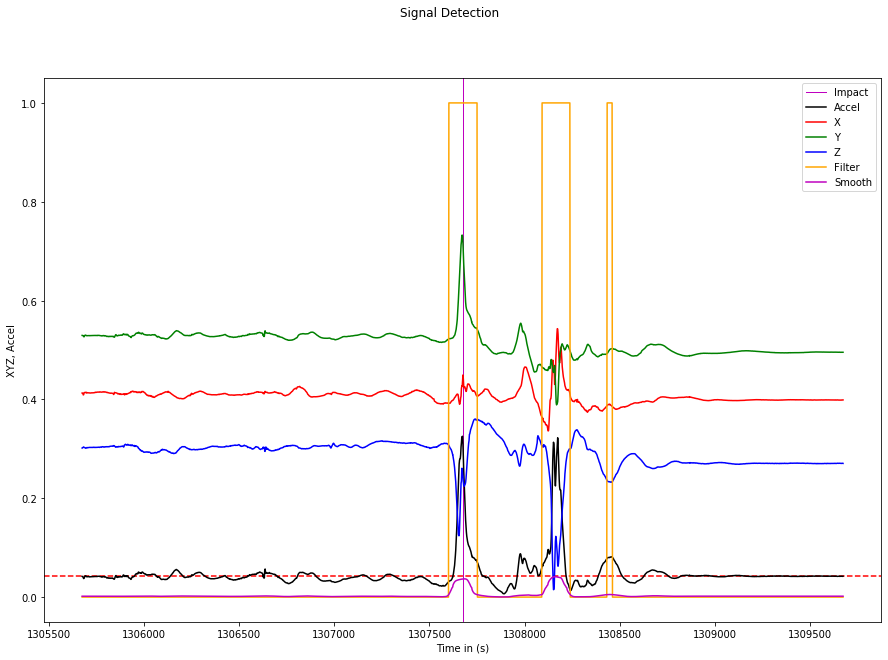

In [128]:
noiseFilter2(data[2], radius=4, fn=10, width=15, height=10)

         accel_base_mag
0           2100.747724
1           2177.987603
2           2174.064626
3           2286.111983
4           2271.778158
...                 ...
1601589     2229.445895
1601590     2220.984016
1601591     2174.245156
1601592     2180.878034
1601593     2160.770233

[1601594 rows x 1 columns]
Final: 501
Accel: 501
         accel_base_mag
0           2100.747724
1           2177.987603
2           2174.064626
3           2286.111983
4           2271.778158
...                 ...
1601589     2229.445895
1601590     2220.984016
1601591     2174.245156
1601592     2180.878034
1601593     2160.770233

[1601594 rows x 1 columns]
Final: 501
Accel: 501
         accel_base_mag
0           2100.747724
1           2177.987603
2           2174.064626
3           2286.111983
4           2271.778158
...                 ...
1601589     2229.445895
1601590     2220.984016
1601591     2174.245156
1601592     2180.878034
1601593     2160.770233

[1601594 rows x 1 columns]
Final: 5

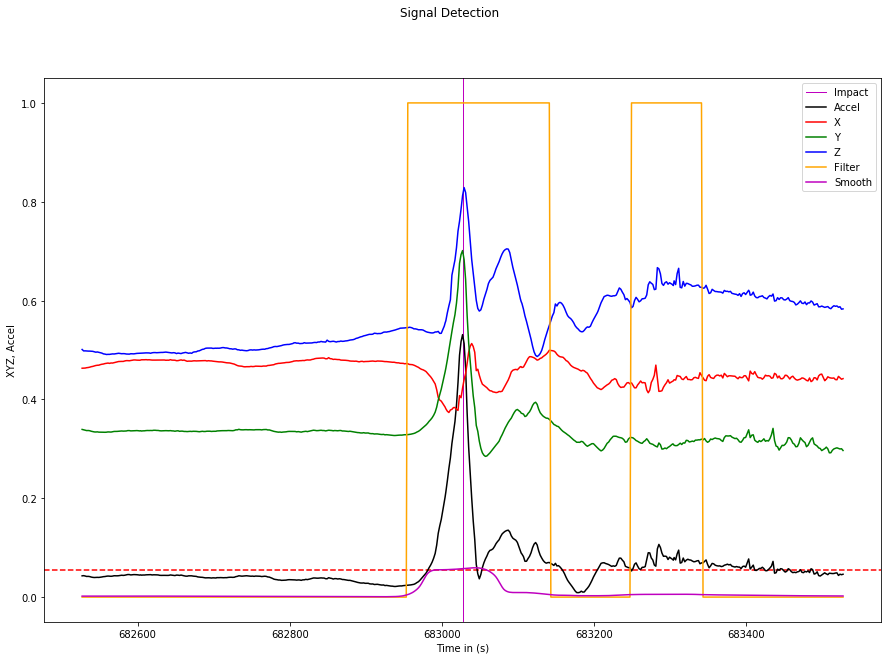

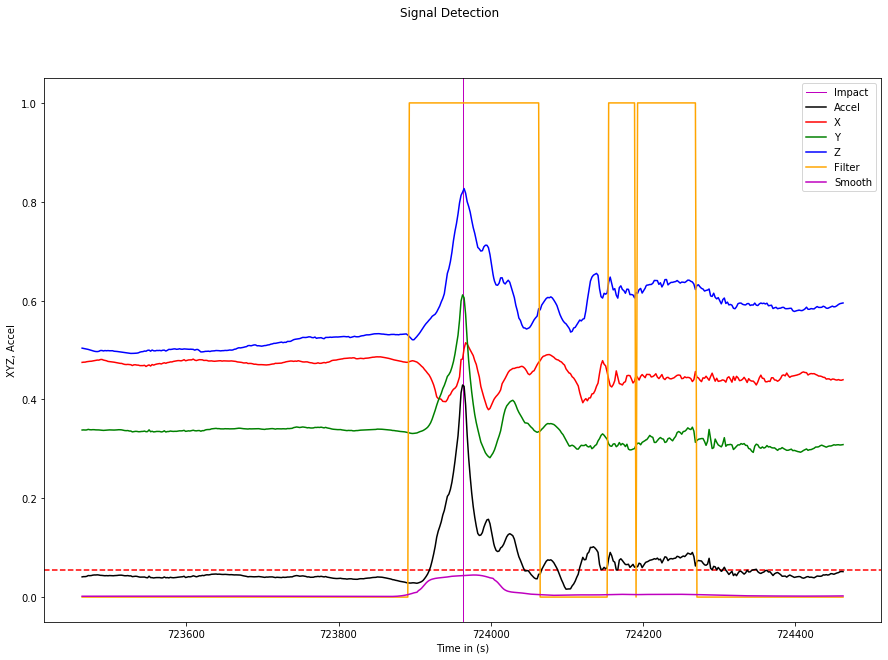

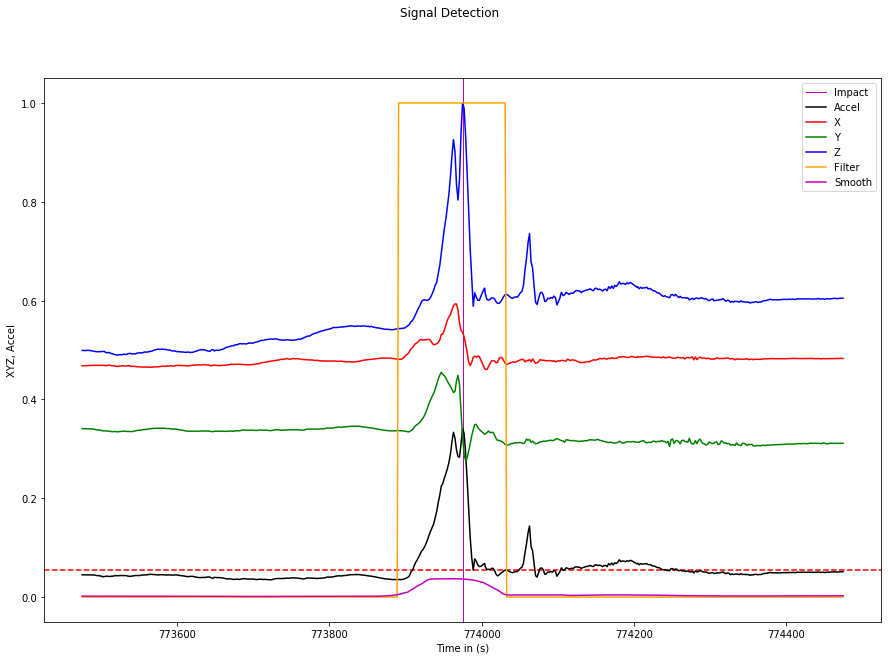

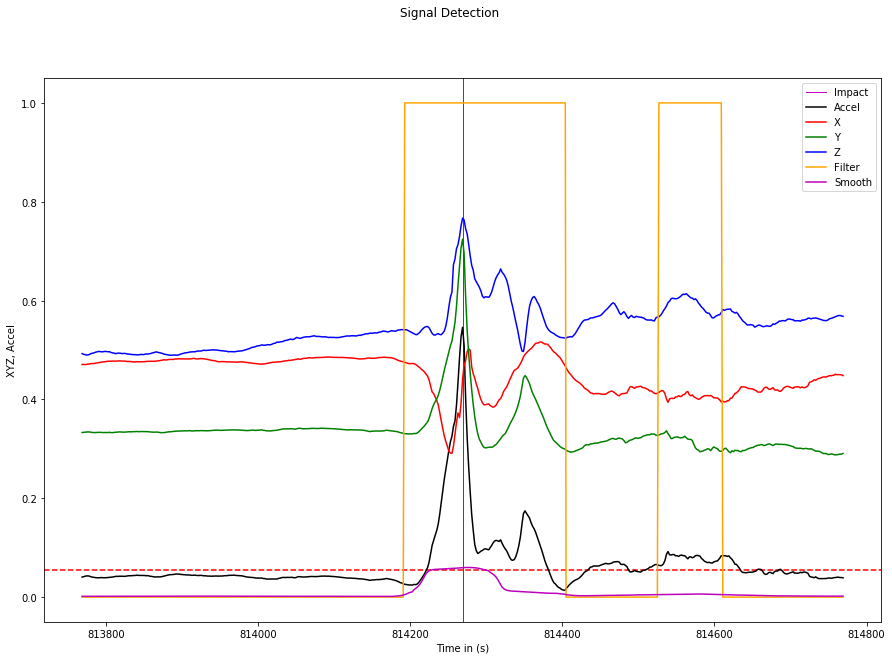

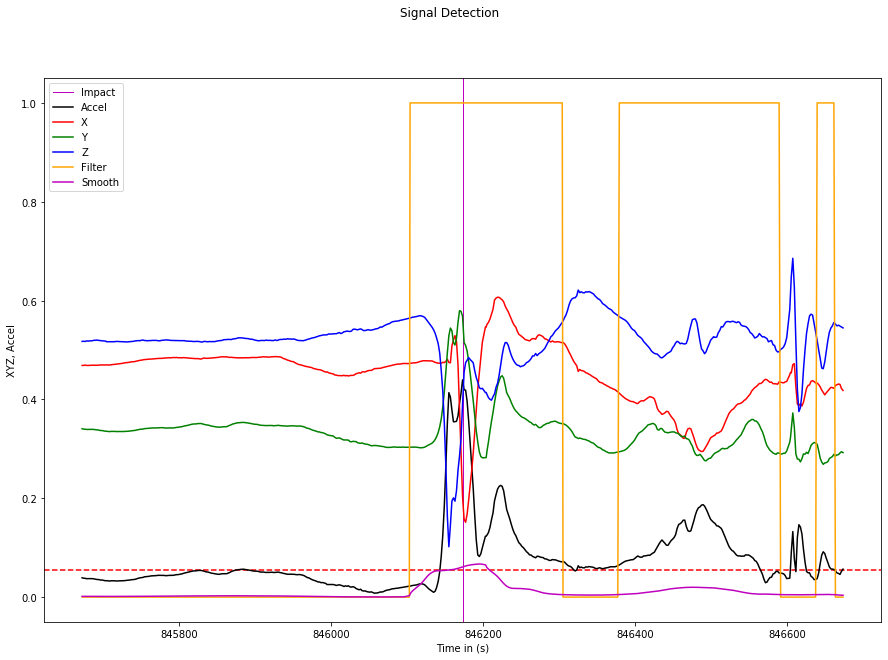

...

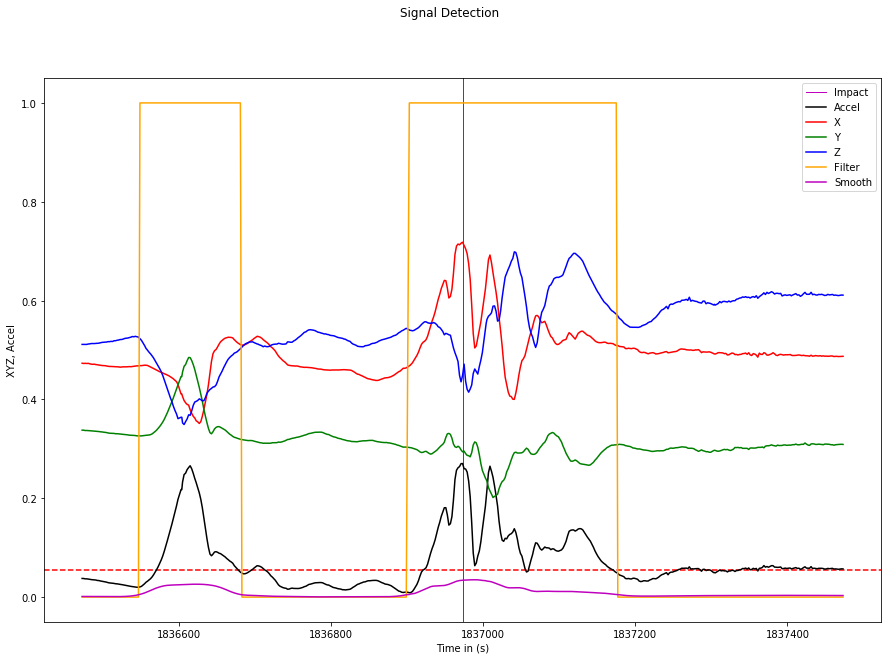

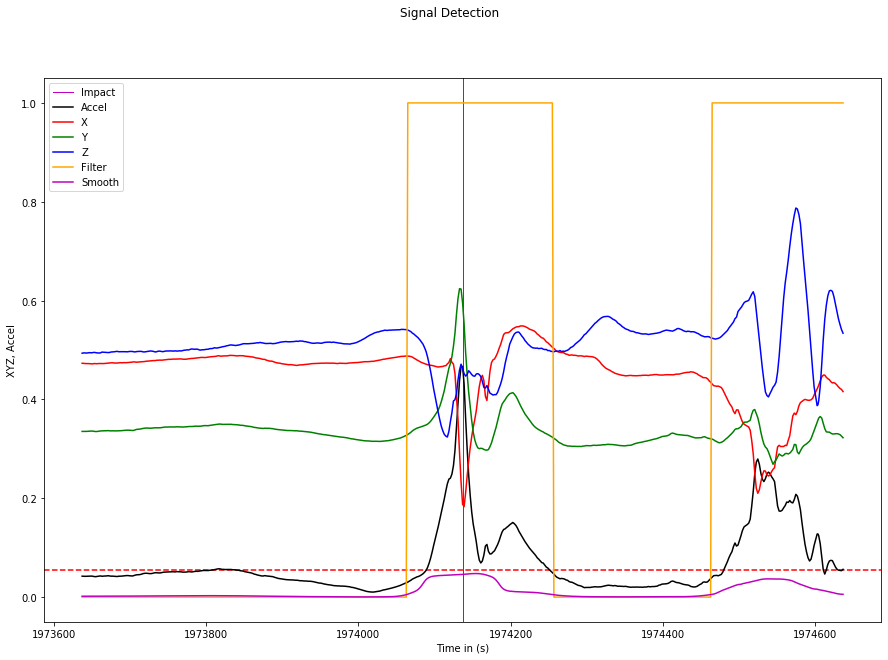

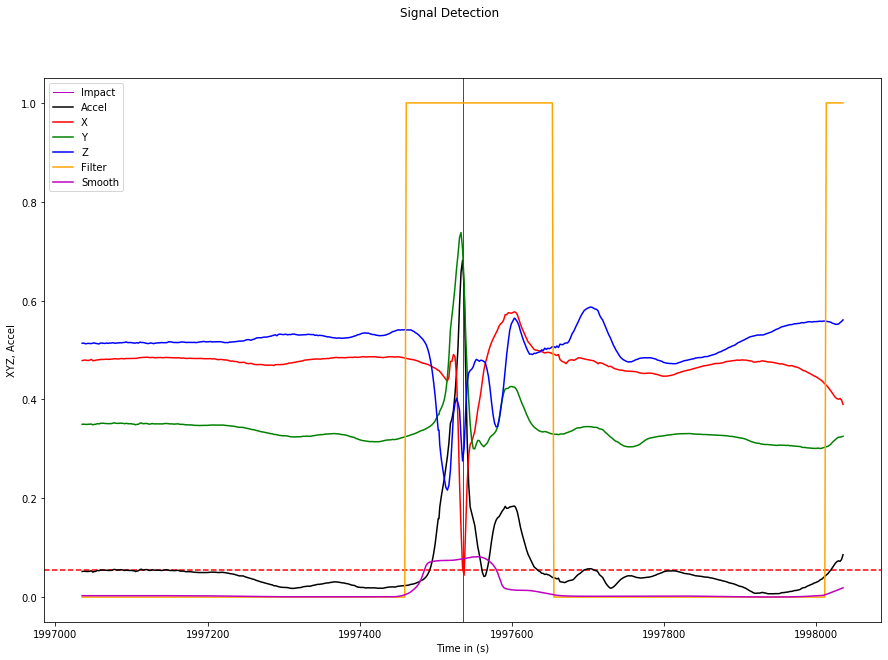

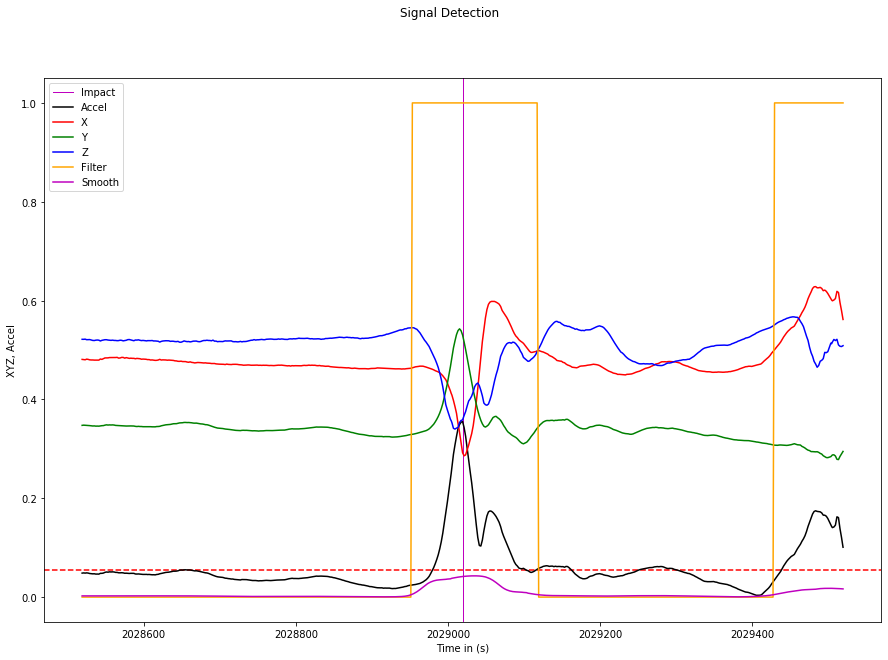

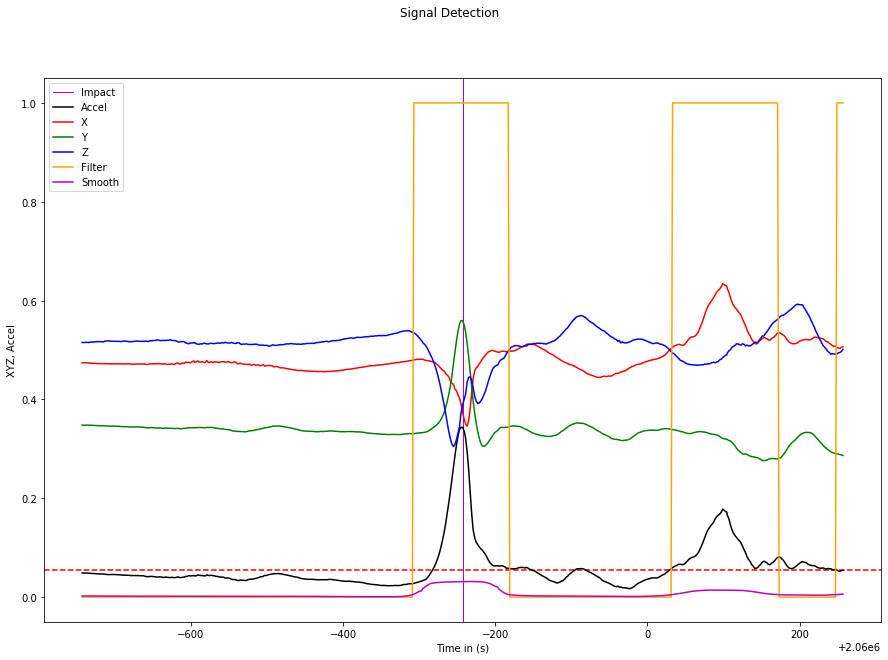

In [119]:
for sub in range(1):
    for i in range(falls[sub]):
        noiseFilter2(data[sub], radius=1, fn=i, width=15, height=10)

Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501
Final: 501
Accel: 501


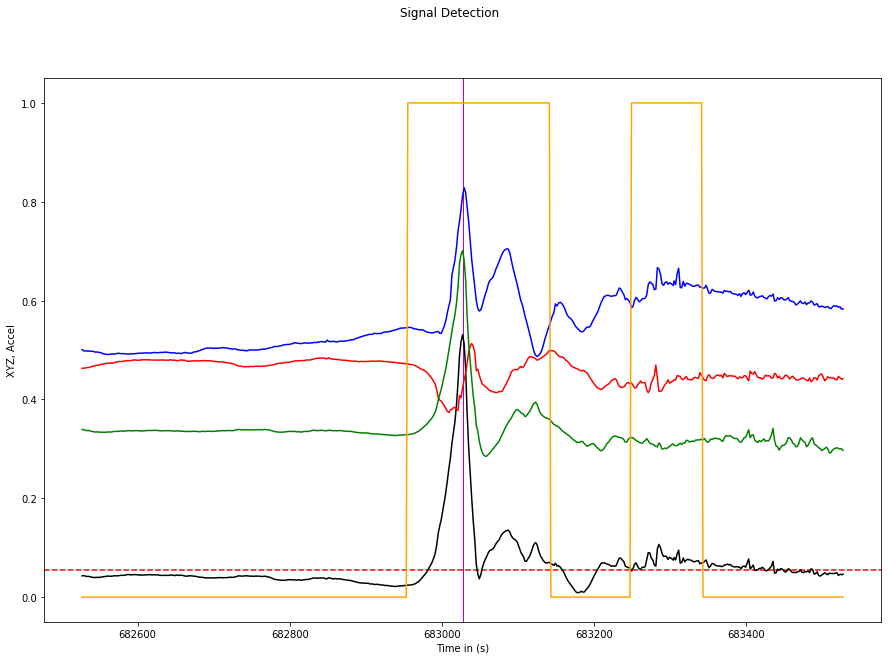

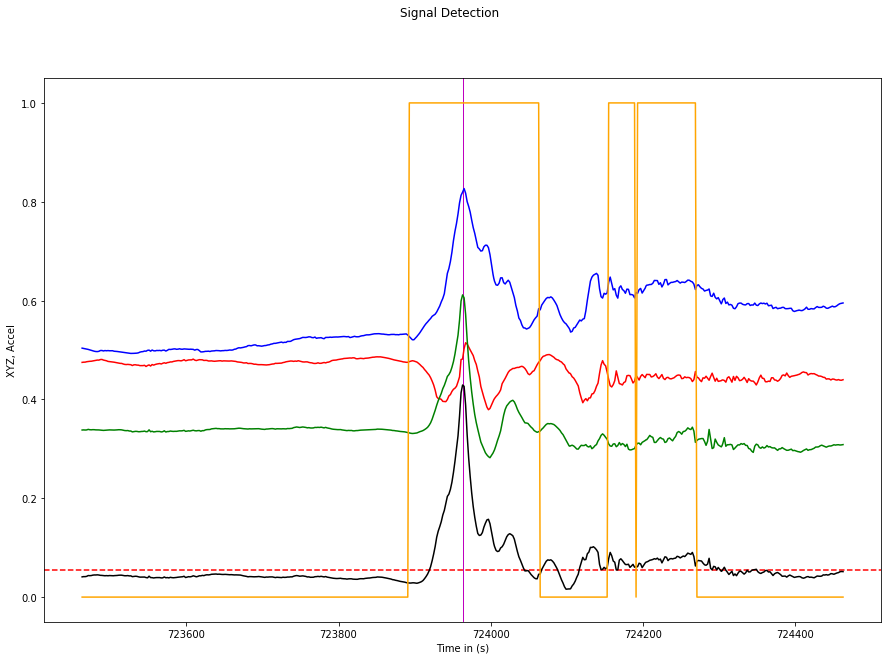

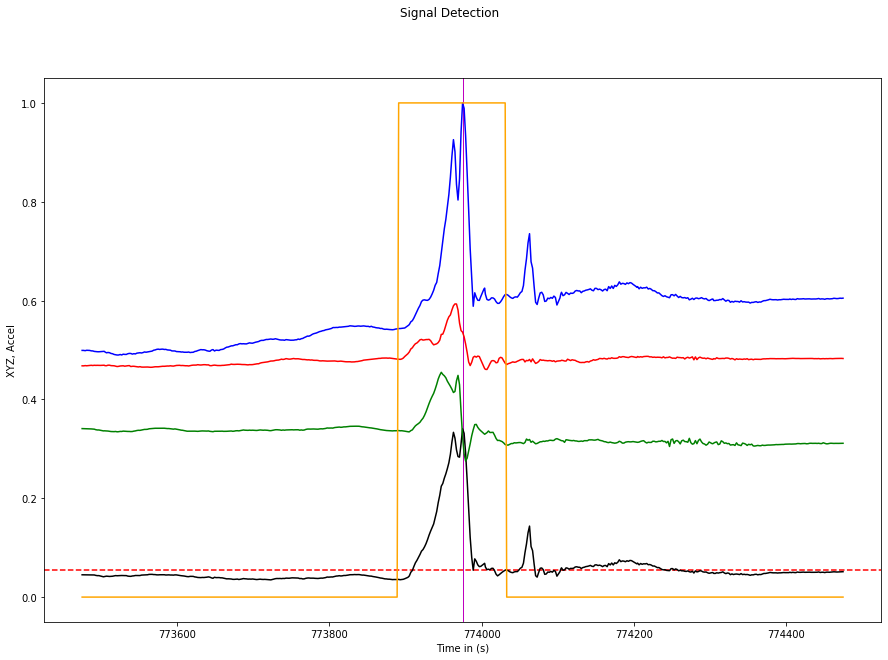

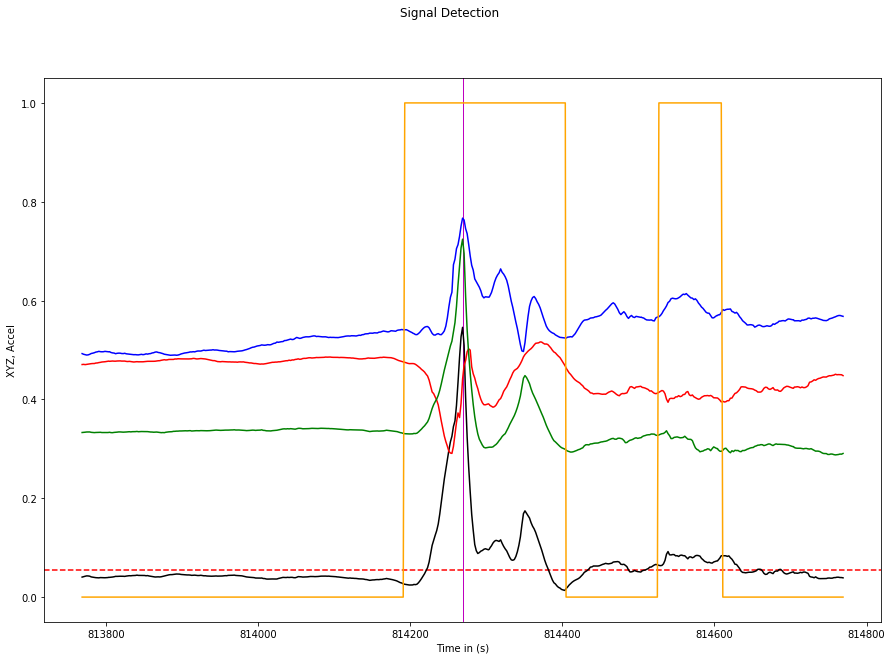

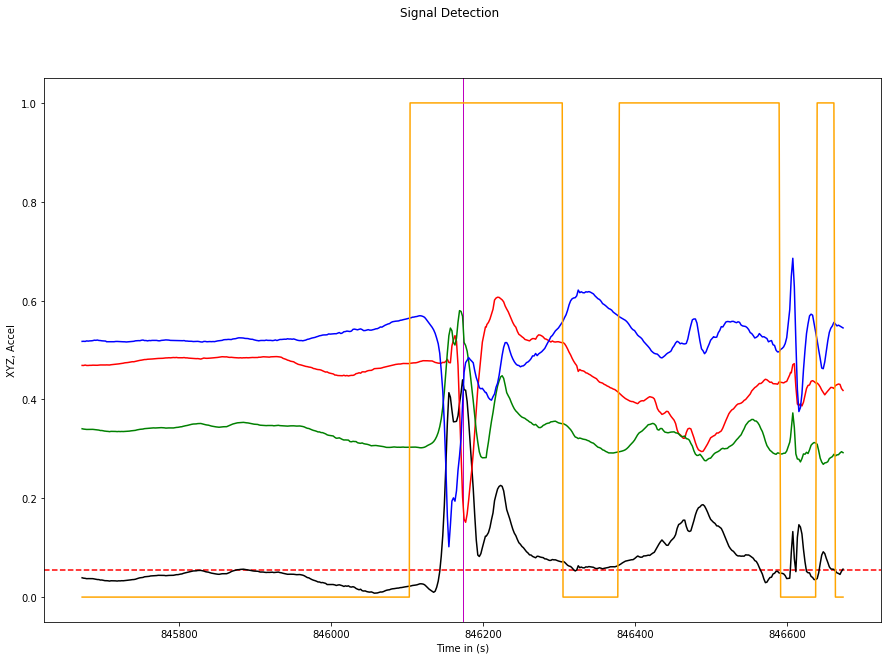

...

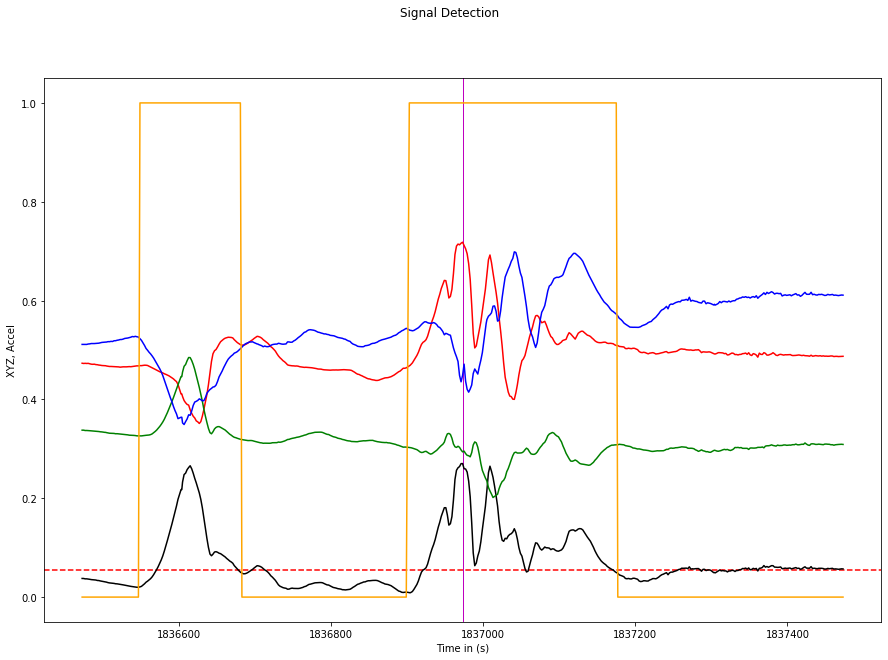

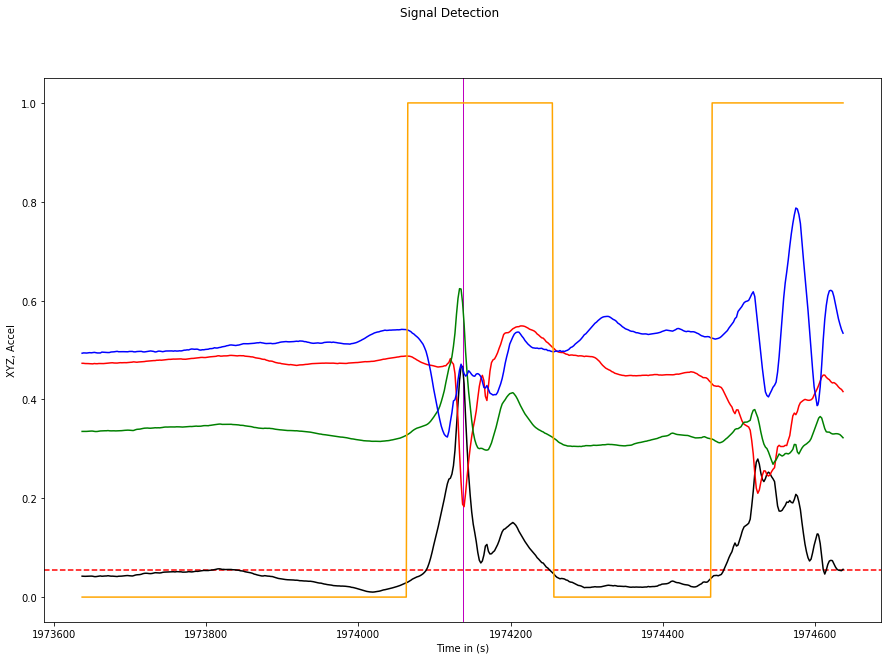

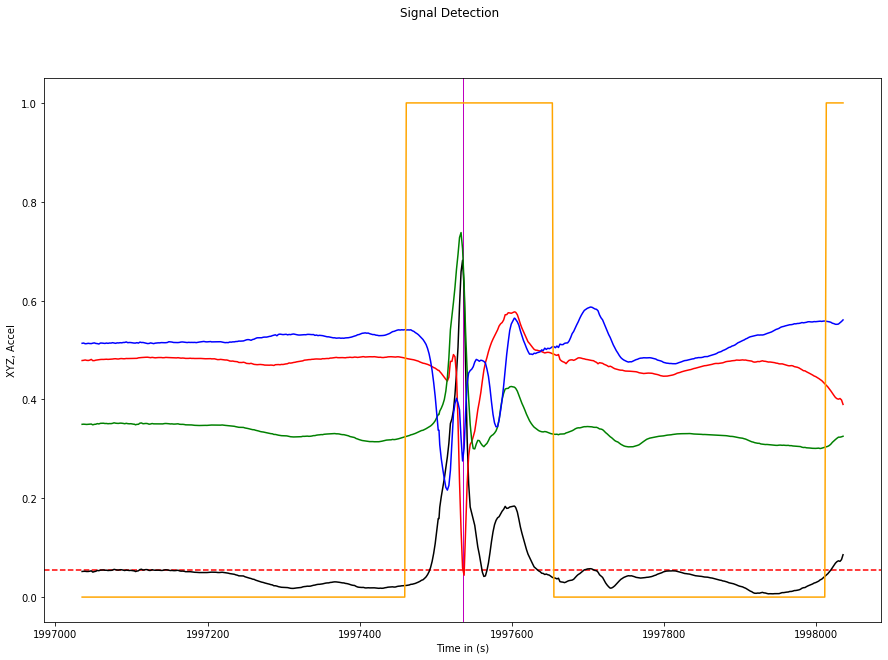

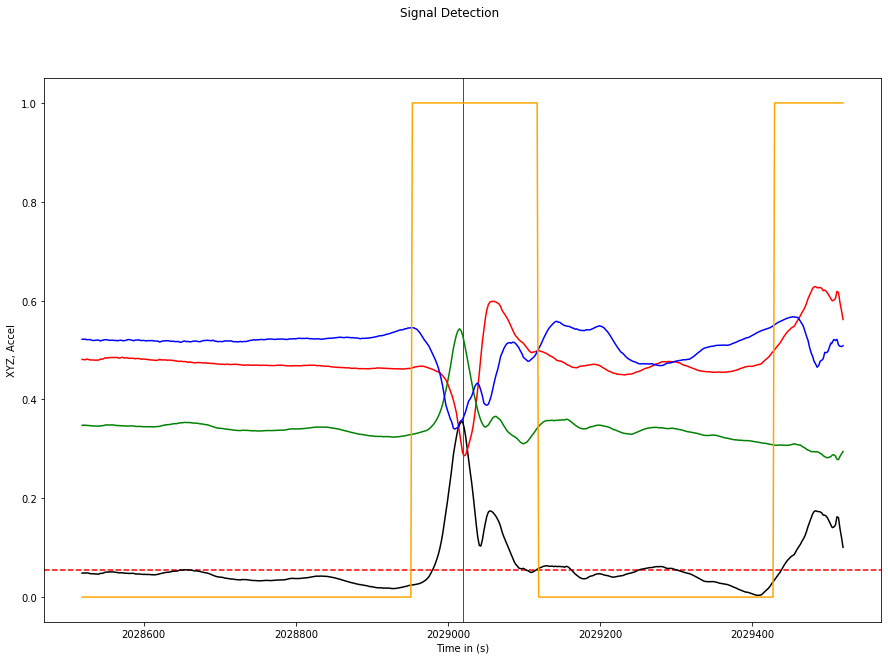

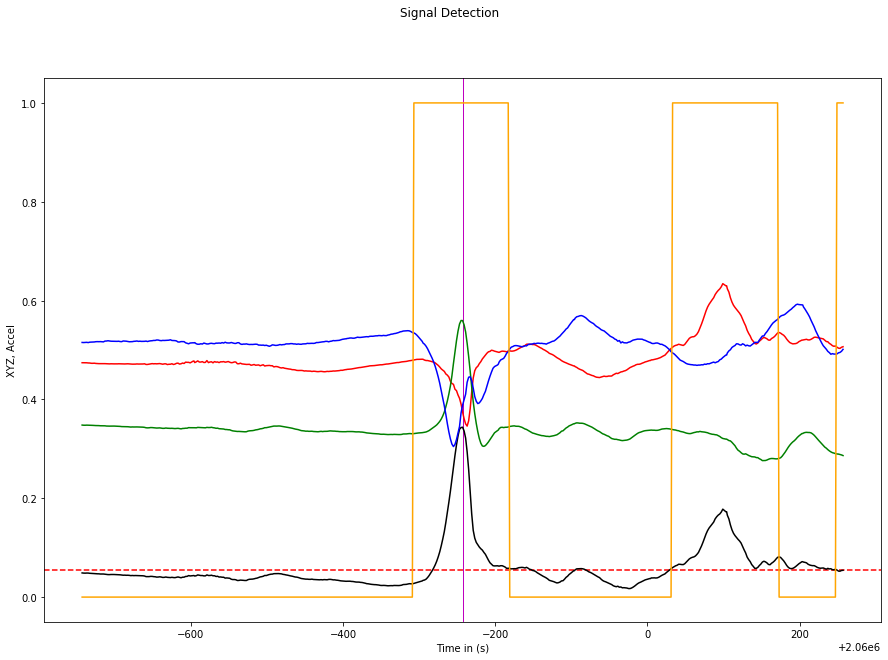

In [111]:
for sub in range(1):
    for i in range(falls[sub]):
        noiseFilter2(data[sub], radius=1, fn=i, width=15, height=10)

In [ ]:
pp = PdfPages("Scaled_Average_Data.pdf")
for subject_num in range(len(data)):
    f = plotAvg(data[subject_num], subjects[subject_num], radius=2, scaled=True, width=15, height=10)
    pp.savefig(f)
f = plotAllAvg(data=data, radius=2, scaled=True, width=15, height=10)
pp.savefig(f)
pp.close()

In [29]:
min_accel = 0
max_accel = 0
avg_accel = 0
for i in range(6):
    print("Data for Subject", subjects[i])
    mi, ma, avg = calculateAverage(data[i])
    min_accel += mi
    max_accel += ma
    avg_accel += avg
    
min_accel /= 6.0
max_accel /= 6.0
avg_accel /= 6.0
print("Global Statistics")
print("Min Accel:", min_accel)
print("Max Accel:", max_accel)
print("Avg Accel:", avg_accel)

Data for Subject S1
Minimum Accel: 8785.364192792465
Maximum Accel: 34527.46589311182
Average Accel: 19569.57390074518


Data for Subject S2
Minimum Accel: 3537.3772770231903
Maximum Accel: 47595.99850827798
Average Accel: 27246.274558788504


Data for Subject S3
Minimum Accel: 8079.203426081064
Maximum Accel: 47491.613459641485
Average Accel: 18850.672905901494


Data for Subject C1
Minimum Accel: 8406.9153677196
Maximum Accel: 34031.69217068114
Average Accel: 19770.816571345516


Data for Subject C2
Minimum Accel: 10705.842563759286
Maximum Accel: 49527.710415483576
Average Accel: 28659.123732993405


Data for Subject C3
Minimum Accel: 2312.1663002474543
Maximum Accel: 44019.413773924796
Average Accel: 18684.37824866013


Global Statistics
Min Accel: 6971.144854603844
Max Accel: 42865.649036853465
Avg Accel: 22130.139986405706
